<a href="https://colab.research.google.com/github/iyoob-utexas/ds4e/blob/main/notebooks/n9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

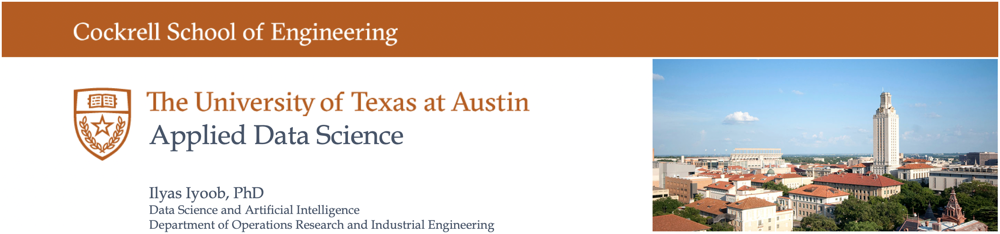

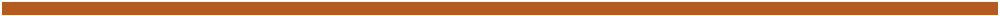

## <font color='#475468'> Shipping Network:</font> 
### <font color='#475468'> Can you determine the best way to ship products at lowest cost?</font> 

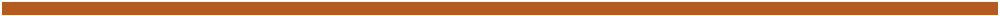

## Initialize

In [6]:
import pandas as pd

!pip3 install pulp
import pulp

## Load Data

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
# Load data
supply_data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/data/shipping/supply_data.csv', index_col=[0])
ship_data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/data/shipping/ship_data.csv', index_col=[0,1])

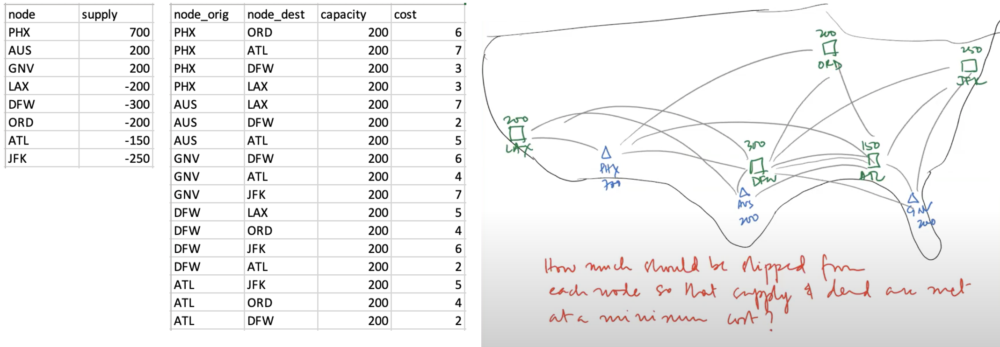

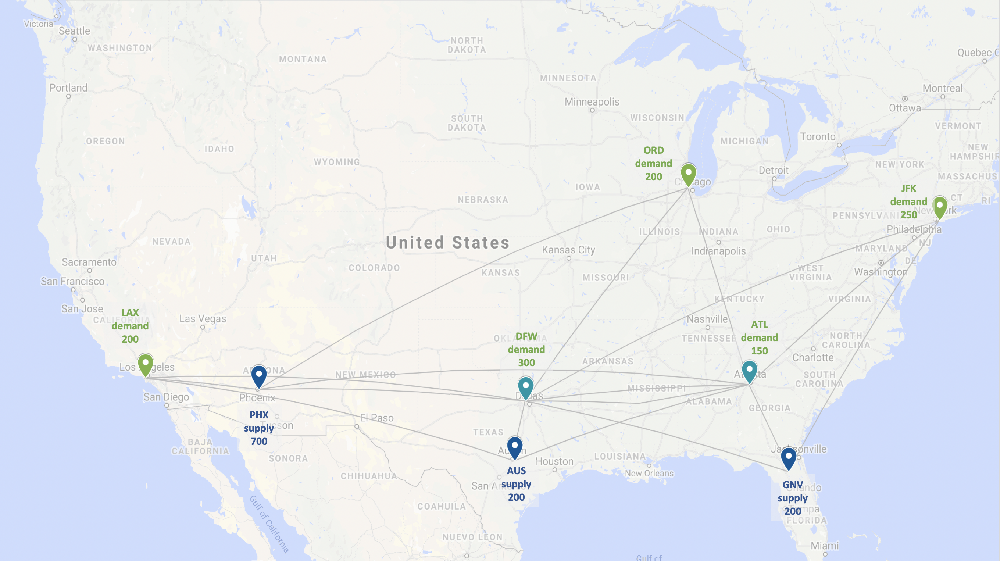

## Build Optimization Model

Since this is a prescriptive decision, we need to build a mathematical model that evaluates many options and selects the best choice while satisfying certain constraints.

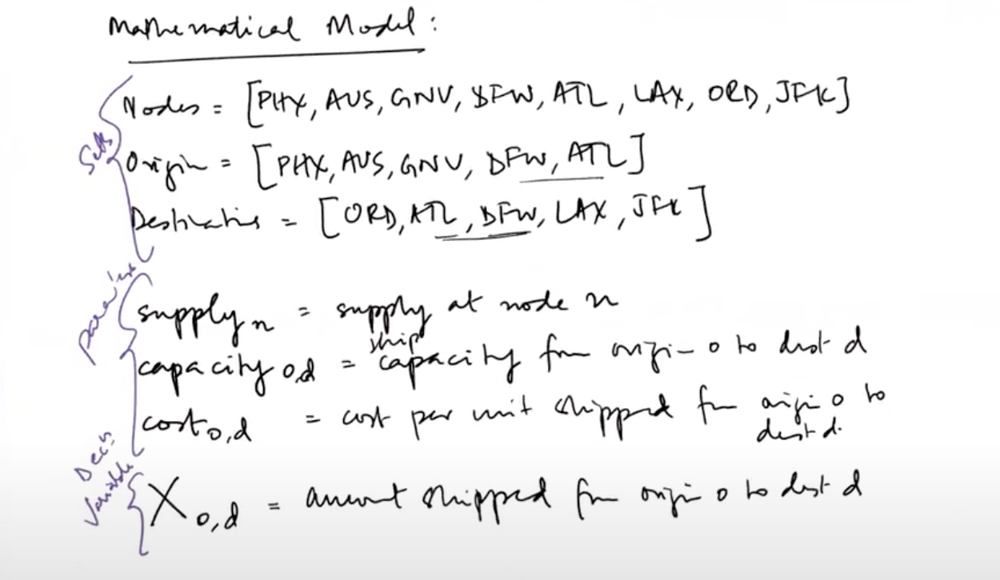

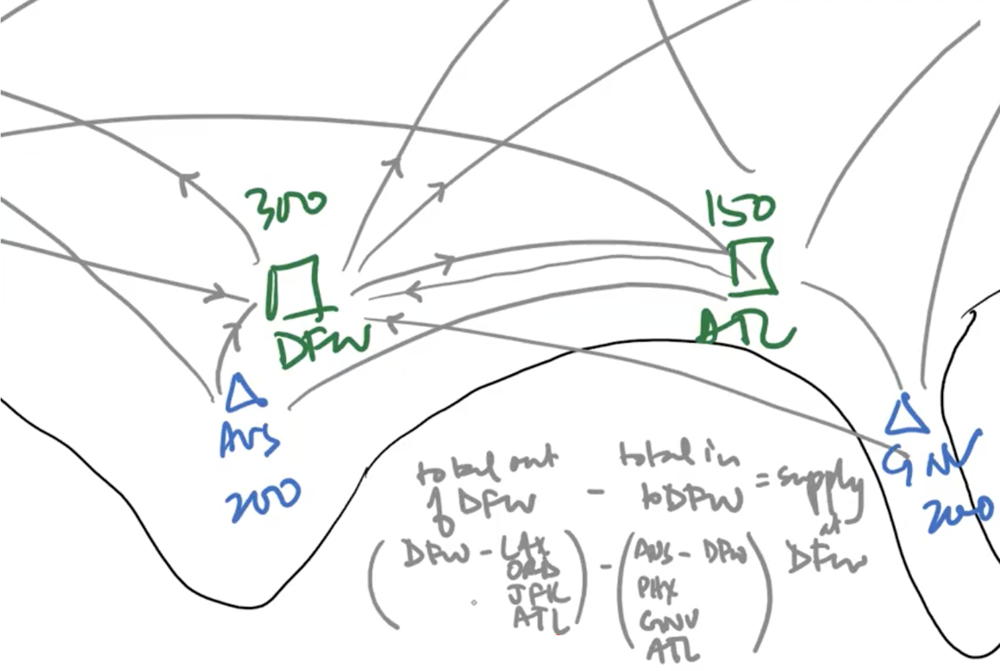

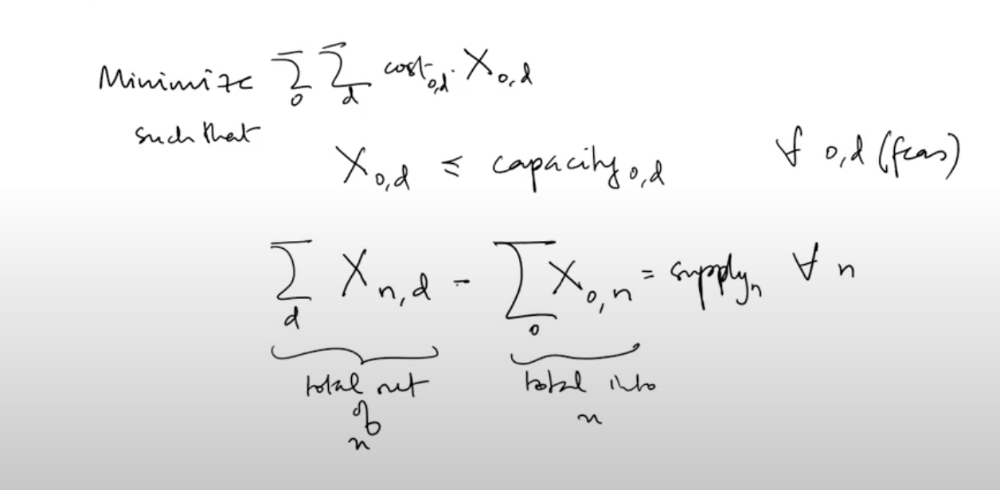

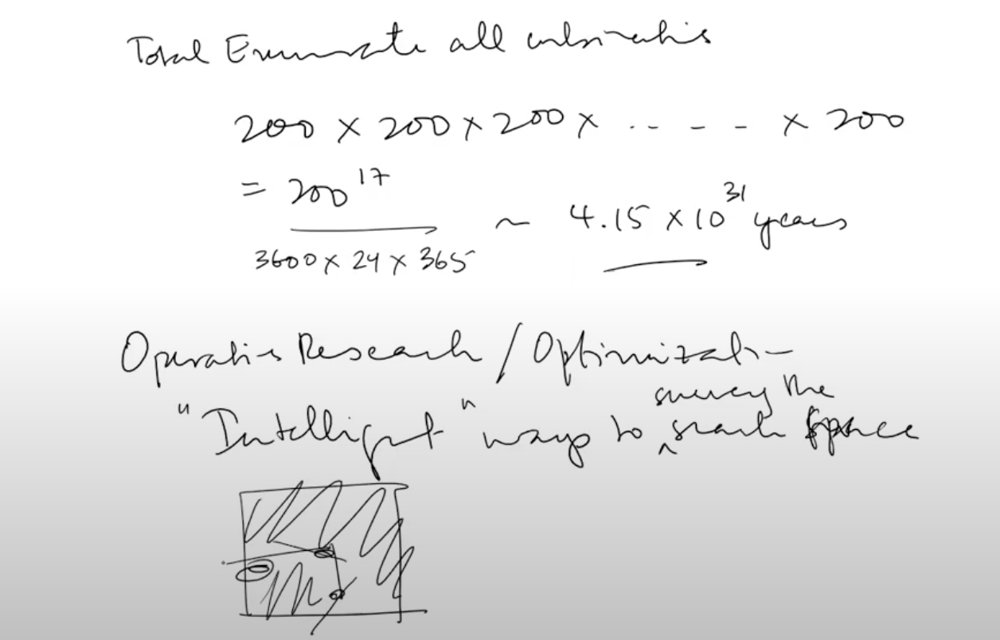

### Sets, Parameters, and Variables

In [9]:
# Sets
N = supply_data.index
O = ship_data.index.levels[0]
D = ship_data.index.levels[1]
OD = ship_data.index

In [10]:
# Parameters
supply = supply_data.loc[:,'supply']
cost = ship_data.loc[:,'cost']
capacity = ship_data.loc[:,'capacity']

In [11]:
# Variables
X = pulp.LpVariable.dicts("X",((o, d) for o, d in OD),lowBound=0, cat='Continuous')

### Model

Since the formulated model doesn't have any non-linear relationships between variables, it can be modeled as a **Linear Program**.

In [12]:
# Define model
mdlShpLp = pulp.LpProblem("Cost minimizing network flow problem", pulp.LpMinimize)

/usr/local/lib/python3.7/dist-packages/pulp/pulp.py:1352: UserWarning: Spaces are not permitted in the name. Converted to '_'
  warnings.warn("Spaces are not permitted in the name. Converted to '_'")


##### Define Objective

In [13]:
# Objective function
mdlShpLp += pulp.lpSum(X[o,d] * cost[o,d] for o,d in OD)

##### Establish Constraints

In [14]:
# Shipment between nodes cannot exceed capacity
for o,d in OD:
    mdlShpLp += X[o,d] <= capacity[o,d]

In [15]:
# Demand at each node should be satisfied
for n in N:
    mdlShpLp += pulp.lpSum(X.get((n,d),0) for d in D) - pulp.lpSum(X.get((o,n),0) for o in O) == supply[n]

##### Run model

In [16]:
# Solve
mdlShpLp.solve()
pulp.LpStatus[mdlShpLp.status]

'Optimal'

### Results

In [17]:
# Minimum cost
print (pulp.value(mdlShpLp.objective))

5300.0


In [18]:
# Optimal shipment selections
for v in mdlShpLp.variables():
    print(v.name, "=", v.varValue)

X_('ATL',_'DFW') = 0.0
X_('ATL',_'JFK') = 0.0
X_('ATL',_'ORD') = 0.0
X_('AUS',_'ATL') = 0.0
X_('AUS',_'DFW') = 200.0
X_('AUS',_'LAX') = 0.0
X_('DFW',_'ATL') = 50.0
X_('DFW',_'JFK') = 50.0
X_('DFW',_'LAX') = 0.0
X_('DFW',_'ORD') = 0.0
X_('GNV',_'ATL') = 0.0
X_('GNV',_'DFW') = 0.0
X_('GNV',_'JFK') = 200.0
X_('PHX',_'ATL') = 100.0
X_('PHX',_'DFW') = 200.0
X_('PHX',_'LAX') = 200.0
X_('PHX',_'ORD') = 200.0


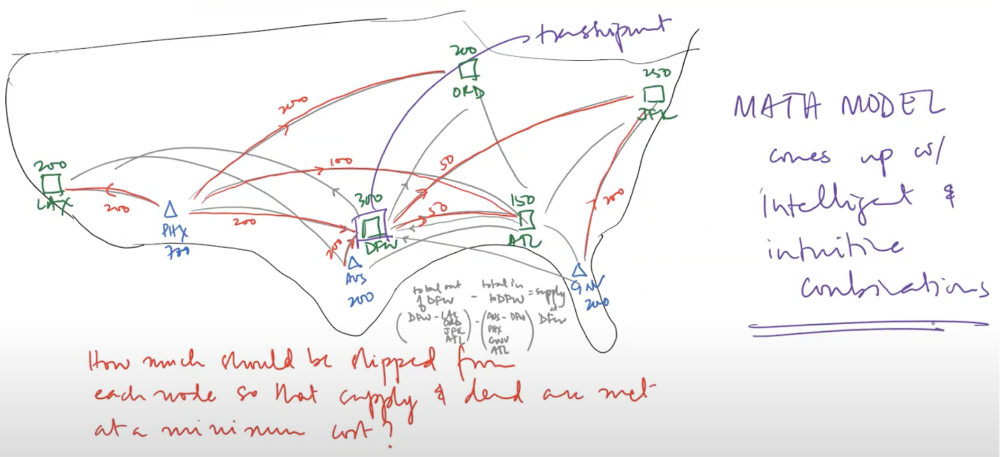

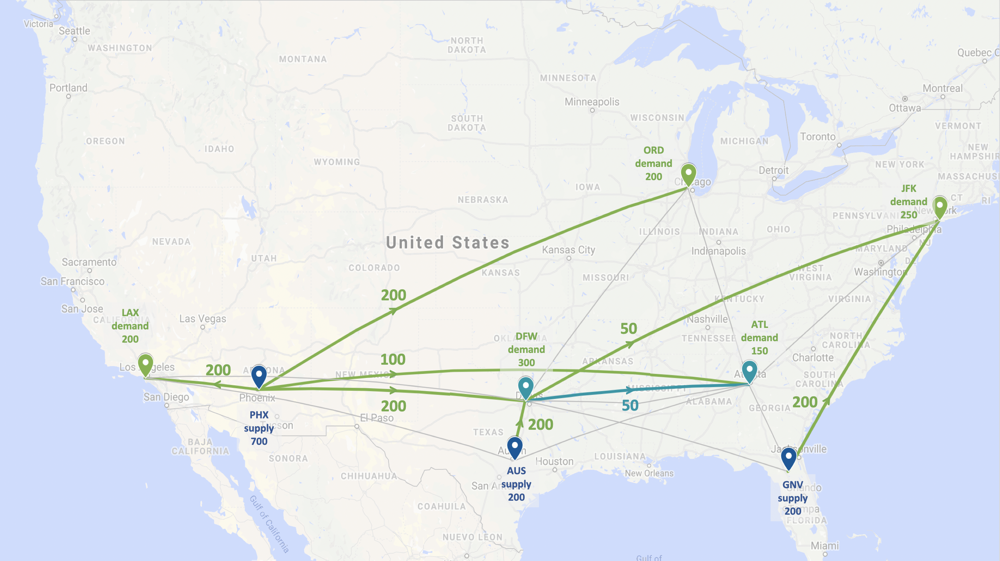

## Takeaways

* Once predictive data science is complete, prescriptive data science is introducted as a subsequent step to optimize decisions using *Linear Programming* 
* Prescriptive data science takes into account constraints and ensures they are satisfied while optimizing the objective

WHITEBOARD >>

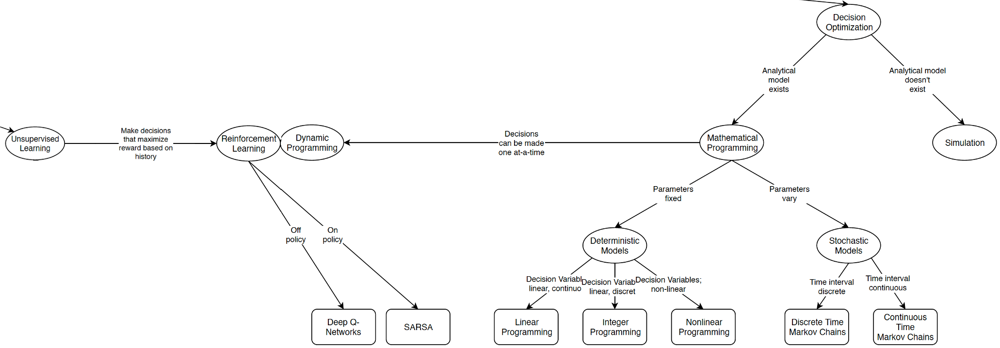

<< WHITEBOARD

utexas_ds_orie_divider_gray.png